<a href="https://colab.research.google.com/github/Muhammad-Talha-MT/Muhammad-Talha-MT-TransferableArchitectureForObjectDetection/blob/main/Defect_Detection_of_Casting_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install detectron2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.activity.readonly&response_type=code

Enter your authorization code:
4/1AY0e-g4xfCwmXUMfsQEpgcK75e5g1QcVa-pQQXSx-mkuxcp1H0kXmQJNHfQ
Mounted at /content/drive
/content/drive/MyDrive


In [ ]:
!mkdir dual_class

In [ ]:
%cd /content/drive/MyDrive/Casting/dual_class

/content/drive/MyDrive/Casting/dual_class


In [ ]:
!curl -L "https://app.roboflow.com/ds/bsjDK0OeRC?key=yUUUvb8X0X" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   888  100   888    0     0   1025      0 --:--:-- --:--:-- --:--:--  1024
100 30.8M  100 30.8M    0     0  16.8M      0  0:00:01  0:00:01 --:--:--  105M
Archive:  roboflow.zip
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/_annotations.coco.json  
 extracting: test/cast_def_0_1015_jpeg.rf.c1fc573a340c60c731fc42308ae1e219.jpg  
 extracting: test/cast_def_0_1139_jpeg.rf.90af0b4eef61aaaa06e386f2a2d9c946.jpg  
 extracting: test/cast_def_0_1145_jpeg.rf.894a53004ffdb0aafa31ea7ff0671ff2.jpg  
 extracting: test/cast_def_0_1147_jpeg.rf.e95d3b691295a2649ca585b2e4483009.jpg  
 extracting: test/cast_def_0_1157_jpeg.rf.02ef52f09248bf24e8440120b75289f1.jpg  
 extracting: test/cast_def_0_1187_jpeg.rf.261392648837a6357d5e29cbada00e0d.jpg  
 extracting: test/cast_def_0_1225_jpeg.rf.be182b5a71f159c9497d06ae0ddf300c.

In [ ]:
# install dependencies: 
!pip install pyyaml==5.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
assert torch.__version__.startswith("1.7")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime
# opencv is pre-installed on colab

     |████████████████████████████████| 276kB 13.1MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44075 sha256=96ff8c6b3910ddfc2babe66acd05738f81a4fe836d0eba175bc1d8b13e5d470f
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.7/index.html
     |████████████████████████████████| 6.8MB 710kB/s 
     |████████████████████████████████| 2.2MB 18.2MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20210115-cp36-none-

In [ ]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.7)
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
import torch, torchvision

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [ ]:
from detectron2.data.datasets import register_coco_instances

register_coco_instances("cast_train", {}, "/content/drive/MyDrive/Casting/dual_class/train/_annotations.coco.json", "/content/drive/MyDrive/Casting/dual_class/train")
register_coco_instances("cast_test", {}, "/content/drive/MyDrive/Casting/dual_class/test/_annotations.coco.json", "/content/drive/MyDrive/Casting/dual_class/test")
register_coco_instances("cast_val", {}, "/content/drive/MyDrive/Casting/dual_class/valid/_annotations.coco.json", "/content/drive/MyDrive/Casting/dual_class/valid")

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:

cfg=get_cfg()
cfg.MODEL.ROI_BOX_CASCADE_HEAD.IOUS=(0.7,0.8,0.9)
print(cfg)

In [ ]:

%pip install -q wandb  
!wandb login

import wandb; 

wandb.init(sync_tensorboard=True)

wandb: Currently logged in as: m-talha (use `wandb login --relogin` to force relogin)


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("cast_train",)
cfg.DATASETS.TEST = ("cast_val",)
# cfg.DATASETS.VAL=("cast_val",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
# cfg.MODEL.ROI_BOX_CASCADE_HEAD.IOUS=(0.7,0.8,0.9)
# for i in range(10):             #beacuse checkpoint willbe made after 1000 iterations
cfg.SOLVER.MAX_ITER = 50000   #  iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 3  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# cfg.MODEL.RETINANET.NUM_CLASSES = 3
cfg.TEST.EVAL_PERIOD = 2000 
#cfg.CHECKPOINT_PERIOD =3
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg) 
trainer.resume_or_load(resume=True)


trainer.train()

[01/20 13:26:42 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
# uncomment it if you eant to train




#trainer.train()

[12/29 08:00:38 d2.engine.train_loop]: Starting training from iteration 1000
[12/29 08:00:44 d2.utils.events]:  eta: 0:00:23  iter: 1019  total_loss: 0.8487  loss_cls: 0.1828  loss_box_reg: 0.6011  loss_rpn_cls: 0.007089  loss_rpn_loc: 0.007886  time: 0.2925  data_time: 0.0148  lr: 0.00025  max_mem: 2321M
[12/29 08:00:50 d2.utils.events]:  eta: 0:00:18  iter: 1039  total_loss: 0.7398  loss_cls: 0.1181  loss_box_reg: 0.615  loss_rpn_cls: 0.005084  loss_rpn_loc: 0.009521  time: 0.3009  data_time: 0.0052  lr: 0.00025  max_mem: 2321M
[12/29 08:00:56 d2.utils.events]:  eta: 0:00:12  iter: 1059  total_loss: 0.7506  loss_cls: 0.1101  loss_box_reg: 0.6038  loss_rpn_cls: 0.003942  loss_rpn_loc: 0.008916  time: 0.2988  data_time: 0.0057  lr: 0.00025  max_mem: 2321M
[12/29 08:01:02 d2.utils.events]:  eta: 0:00:06  iter: 1079  total_loss: 0.7244  loss_cls: 0.12  loss_box_reg: 0.6032  loss_rpn_cls: 0.004088  loss_rpn_loc: 0.008036  time: 0.2985  data_time: 0.0052  lr: 0.00025  max_mem: 2321M
[12/29

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we randomly select several samples to visualize the prediction results.

WARNING [01/20 14:15:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 14:15:19 d2.data.datasets.coco]: Loaded 155 images in COCO format from /content/drive/MyDrive/Casting/dual_class/test/_annotations.coco.json


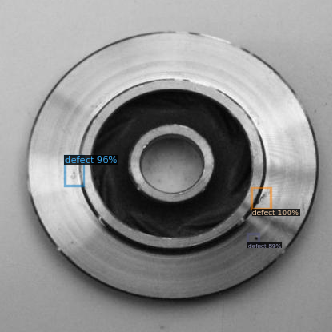

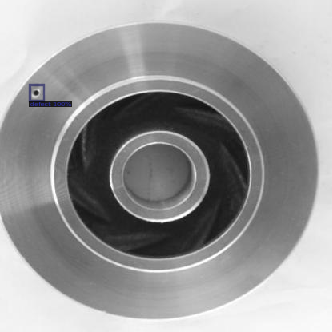

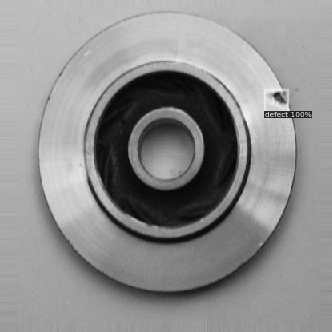

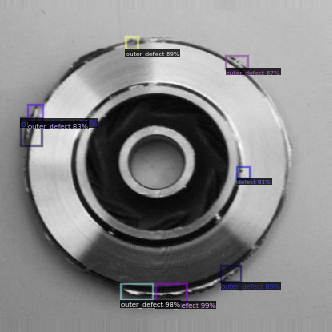

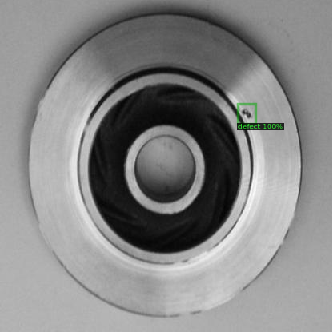

...

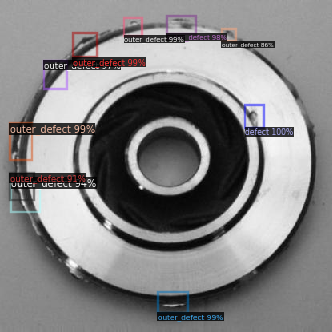

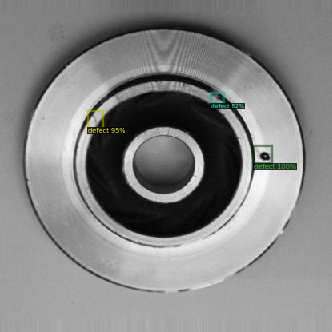

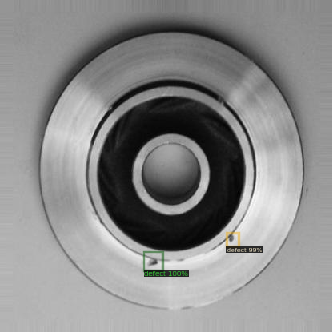

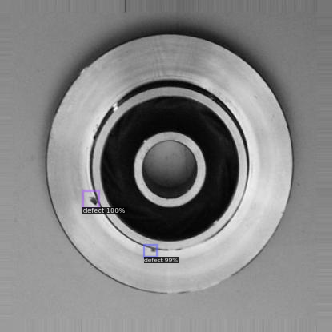

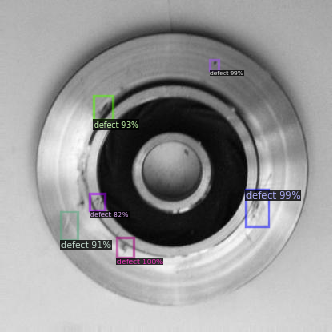

In [ ]:
from detectron2.utils.visualizer import ColorMode
# register_coco_instances("cad_test", {}, "/content/test/_annotations.coco.json", "/content/test")
#Use the final weights generated after successful training for inference  
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8  # set the testing threshold for this model
#Pass the validation dataset
cfg.DATASETS.TEST = ("cast_val",)

predictor = DefaultPredictor(cfg)
my_dataset_valid_metadata = MetadataCatalog.get("cast_test")
dataset_dicts = DatasetCatalog.get("cast_test")
# for d in random.sample(dataset_dicts, 10):  
for d in dataset_dicts: 
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=my_dataset_valid_metadata, 
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE   
    )
    # print(outputs)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu")) #Passing the predictions to CPU from the GPU
    cv2_imshow(v.get_image()[:, :, ::-1])

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("cast_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "cast_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [01/20 14:16:49 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass tasks in directly
WARNING [01/20 14:16:49 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[01/20 14:16:49 d2.data.datasets.coco]: Loaded 155 images in COCO format from /content/drive/MyDrive/Casting/dual_class/test/_annotations.coco.json
[01/20 14:16:49 d2.data.build]: Distribution of instances among all 3 categories:
|  category  | #instances   |  category  | #instances   |   category   | #instances   |
|:----------:|:-------------|:----------:|:-------------|:------------:|:-------------|
|   defect   | 0            |   defect   | 227          | outer_defect | 304          |
|            |              |            |              |              |              |
|   total    | 531          |            |              |              |              |
[01/20 14:16:49 d2.data.dataset_map

OrderedDict([('bbox',
              {'AP': 6.910849063039093,
               'AP-defect': 6.824955478654206,
               'AP-outer_defect': 6.996742647423981,
               'AP50': 30.51587209120964,
               'AP75': 0.6039253960157283,
               'APl': nan,
               'APm': 0.9061468646864687,
               'APs': 7.653138962336705})])